In [59]:
#Remove unnecessary warnings

import warnings
import sklearn.exceptions
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=sklearn.exceptions.UndefinedMetricWarning)

#Genral
import pandas as pd
import numpy as np
from scipy.stats import mode

#Visualization
import matplotlib.pyplot as plt
from matplotlib import offsetbox
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Dimensionallity Reduction
from sklearn.manifold import Isomap, TSNE
from sklearn.decomposition import PCA

# Clustering
from sklearn.mixture import GaussianMixture

#Metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report

#DL
from keras.models import Sequential
from keras.layers import Dense , Dropout , Lambda, Flatten
from keras.optimizers import Adam ,RMSprop
from sklearn.model_selection import train_test_split
from keras import  backend as K
from keras.preprocessing.image import ImageDataGenerator
from keras.models import  Sequential
from keras.layers.core import  Lambda , Dense, Flatten, Dropout
from keras.callbacks import EarlyStopping
from keras.layers import BatchNormalization, Convolution2D , MaxPooling2D

In [11]:
path_tr = 'Dataset/digit/train.csv'
path_te = 'Dataset/digit/test.csv'
train = pd.read_csv(path_tr)
test = pd.read_csv(path_te)

In [12]:
#EDA
train_data = train.drop(['label'], axis=1).values.reshape(-1,28,28,1)
train_data = test.values.reshape(-1,28,28,1)

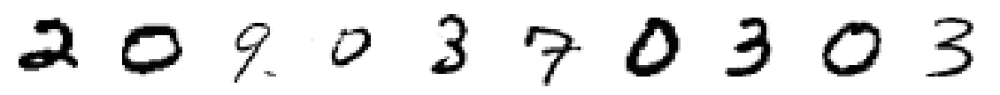

In [13]:
num_examples = 10
plt.figure(figsize=(20,20))
for i in range(num_examples):
    plt.subplot(1, num_examples, i+1)
    plt.imshow(train_data[i], cmap='Greys')
    plt.axis('off')
plt.show()

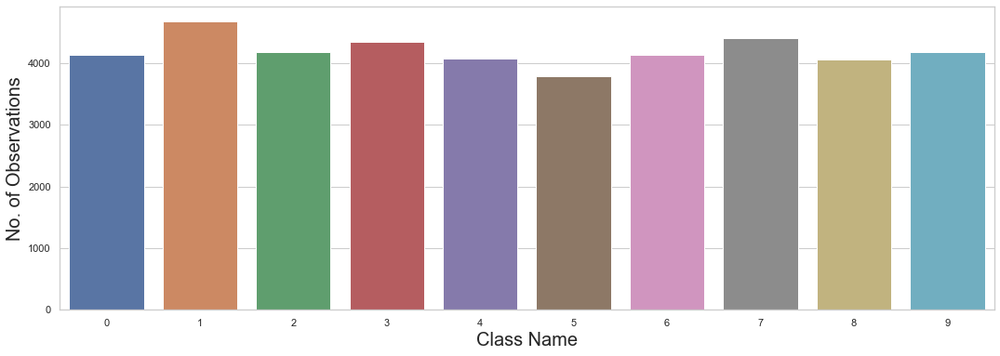

In [14]:
ax = plt.subplots(figsize=(18, 6))
sns.set_style("whitegrid")
sns.countplot(x='label', data=train);
plt.ylabel("No. of Observations", size=20);
plt.xlabel("Class Name", size=20);

In [17]:
iso = Isomap(n_components=2)

# Using only 1/10 of the data as full data takes a lot of time to run
iso.fit(train.drop(['label'], axis=1)[::10])
data_2d = iso.transform(train.drop(['label'], axis=1)[::10])

iso_df = pd.DataFrame(data_2d)
iso_df['label'] = train.label.values[::10]
iso_df.columns = ['x', 'y', 'label']
# Converting label to string to get discrete colors in plot
iso_df['label'] = iso_df['label'].astype(str)
iso_df.head()

,x,y,label
0,-3164.522146,-2876.064133,1
1,-1392.993977,-3268.073825,8
2,-505.836838,-2730.492689,8
3,-1892.122937,-2603.238878,8
4,-1155.536391,-2238.244455,9


In [18]:
fig = px.scatter(iso_df, x='x', y='y', color='label',
                 hover_data=['label'])
fig.update_layout(title = 'MNIST ISOmap 2D')
fig.show()

In [20]:
iso = Isomap(n_components=3)

# Using only 1/10 of the data as full data takes a lot of time to run
iso.fit(train.drop(['label'], axis=1)[::10])
data_3d = iso.transform(train.drop(['label'], axis=1)[::10])

iso_df = pd.DataFrame(data_3d)
iso_df['label'] = train.label.values[::10]
iso_df.columns = ['x', 'y', 'z', 'label']
# Converting label to string to get discrete colors in plot
iso_df['label'] = iso_df['label'].astype(str)
iso_df.head()

,x,y,z,label
0,-3164.522146,-2876.064133,2769.434567,1
1,-1392.993977,-3268.073825,2537.656185,8
2,-505.836838,-2730.492689,1403.573999,8
3,-1892.122937,-2603.238878,1973.673223,8
4,-1155.536391,-2238.244455,-2228.778622,9


In [21]:
fig = px.scatter_3d(iso_df, x='x', y='y', z='z', color='label',
                    hover_data=['label'])
fig.update_layout(title = 'MNIST ISOmap 3D')
fig.show()

In [22]:
pca = PCA(n_components=2)

# Using only 1/5 of the data as full data takes a lot of time to run
pca.fit(train.drop(['label'], axis=1)[::5])
data_2d = pca.transform(train.drop(['label'], axis=1)[::5])

pca_df = pd.DataFrame(data_2d)
pca_df['label'] = train.label.values[::5]
pca_df.columns = ['x', 'y', 'label']
# Converting label to string to get discrete colors in plot
pca_df['label'] = pca_df['label'].astype(str)
pca_df.head()

,x,y,label
0,-689.649729,-684.841145,1
1,492.013831,194.766994,0
2,251.532665,368.985210,8
3,-965.636628,-269.216092,1
4,-253.193108,-244.219670,8


In [23]:
fig = px.scatter(pca_df, x='x', y='y', color='label',
                 hover_data=['label'])
fig.update_layout(title = 'MNIST PCA 2D')
fig.show()

In [24]:
pca = PCA(n_components=3)

# Using only 1/5 of the data as full data takes a lot of time to run
pca.fit(train.drop(['label'], axis=1)[::5])
data_3d = pca.transform(train.drop(['label'], axis=1)[::5])

pca_df = pd.DataFrame(data_3d)
pca_df['label'] = train.label.values[::5]
pca_df.columns = ['x', 'y', 'z', 'label']
# Converting label to string to get discrete colors in plot
pca_df['label'] = pca_df['label'].astype(str)
pca_df.head()

,x,y,z,label
0,-689.649689,-684.839668,180.456854,1
1,492.013594,194.771014,29.515256,0
2,251.532737,368.991974,517.995499,8
3,-965.636748,-269.217784,-18.310800,1
4,-253.192970,-244.219461,306.347135,8


In [25]:
fig = px.scatter_3d(pca_df, x='x', y='y', z='z', color='label',
                    hover_data=['label'])
fig.update_layout(title = 'MNIST PCA 3D')
fig.show()

In [27]:
tsne = TSNE(n_components=2)

# Using only 1/5 of the data as full data takes a lot of time to run
data_2d = tsne.fit_transform(train.drop(['label'], axis=1)[::5])

tsne_df = pd.DataFrame(data_2d)
tsne_df['label'] = train.label.values[::5]
tsne_df.columns = ['x', 'y', 'label']
# Converting label to string to get discrete colors in plot
tsne_df['label'] = tsne_df['label'].astype(str)
tsne_df.head()

,x,y,label
0,14.352872,72.942108,1
1,-67.309128,-7.355806,0
2,20.881321,-4.600010,8
3,21.698875,43.279839,1
4,0.977073,-12.678686,8


In [28]:
fig = px.scatter(tsne_df, x='x', y='y', color='label',
                 hover_data=['label'])
fig.update_layout(title = 'MNIST tSNE 2D')
fig.show()

In [29]:
tsne = TSNE(n_components=3)

# Using only 1/5 of the data as full data takes a lot of time to run
data_3d = tsne.fit_transform(train.drop(['label'], axis=1)[::5])

tsne_df = pd.DataFrame(data_3d)
tsne_df['label'] = train.label.values[::5]
tsne_df.columns = ['x', 'y', 'z', 'label']
# Converting label to string to get discrete colors in plot
tsne_df['label'] = tsne_df['label'].astype(str)
tsne_df.head()

,x,y,z,label
0,9.708053,16.260897,10.842503,1
1,0.429471,-15.184959,16.540277,0
2,-7.083715,5.607975,0.273685,8
3,-0.142162,13.960111,-0.510058,1
4,-11.832132,7.044507,7.236640,8


In [30]:
fig = px.scatter_3d(tsne_df, x='x', y='y', z='z', color='label',
                    hover_data=['label'])
fig.update_layout(title = 'MNIST tSNE 3D')
fig.show()

In [34]:
def plot_components(data, model, images=None, ax=None, thumb_frac=0.05, cmap='gray'):
    ax = ax or plt.gca()
    proj = model.fit_transform(data)
    ax.plot(proj[:, 0], proj[:, 1], '.k')
    if images is not None:
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=cmap),
                proj[i])
            ax.add_artist(imagebox)

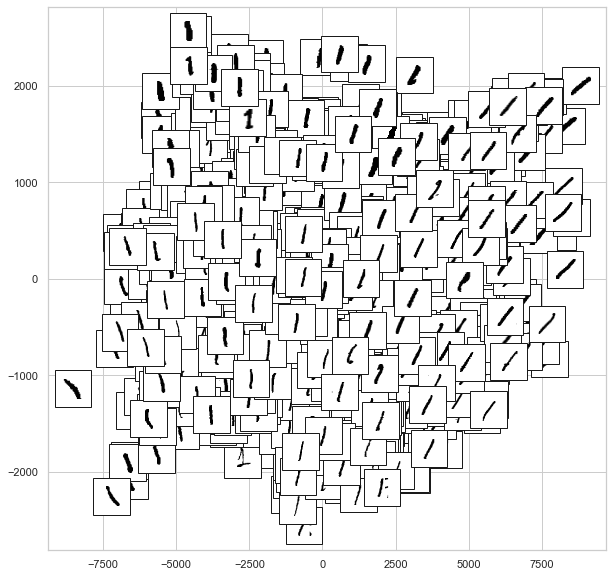

In [35]:
fig, ax = plt.subplots(figsize=(10, 10))
model = Isomap(n_neighbors=5, n_components=2, eigen_solver='dense')
data = train[train.label == 1][::5]
data = data.drop(['label'], axis=1).values
plot_components(data, model, images=data.reshape((-1, 28, 28)), ax=ax, thumb_frac=0.05, cmap='gray_r')

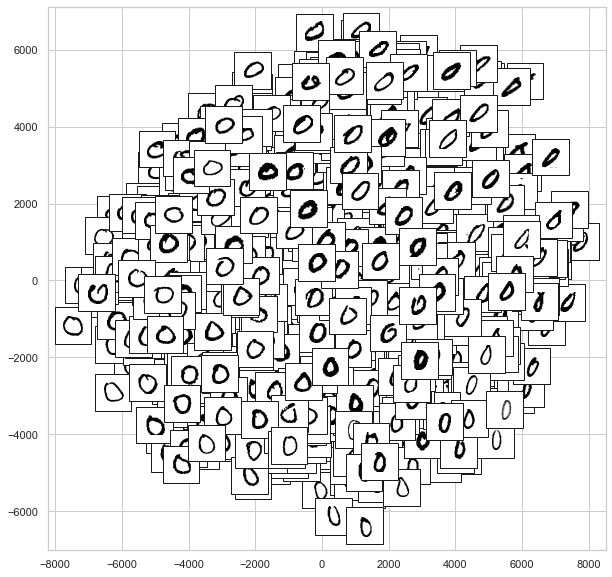

In [36]:
fig, ax = plt.subplots(figsize=(10, 10))
model = Isomap(n_neighbors=5, n_components=2, eigen_solver='dense')
data = train[train.label == 0][::5]
data = data.drop(['label'], axis=1).values
plot_components(data, model, images=data.reshape((-1, 28, 28)), ax=ax, thumb_frac=0.05, cmap='gray_r')

In [38]:
#Before clustering, let's reduce the dimentionality of the digits using TSNE.
tsne = TSNE(n_components=3,
            n_jobs=-1)
digits_proj = tsne.fit_transform(train.drop(['label'], axis=1))

In [41]:
gmm = GaussianMixture(
    n_components=train.label.nunique())
clusters = gmm.fit_predict(digits_proj)

In [43]:
labels = np.zeros_like(clusters)
for i in range(10):
    mask = (clusters == i)
    labels[mask] = mode(train.label[mask])[0]

In [71]:
mapping_dict = {}
for i in range(10):
    mask = (clusters == i)
    mapping_dict[i] = mode(train.label[mask])[0]
print(mapping_dict)

{0: array([0], dtype=int64), 1: array([9], dtype=int64), 2: array([2], dtype=int64), 3: array([8], dtype=int64), 4: array([6], dtype=int64), 5: array([1], dtype=int64), 6: array([7], dtype=int64), 7: array([4], dtype=int64), 8: array([3], dtype=int64), 9: array([5], dtype=int64)}


In [47]:
acc = metrics.accuracy_score(train.label.values, labels)
print(f'Accuracy Score: {acc}')

Accuracy Score: 0.8723095238095238


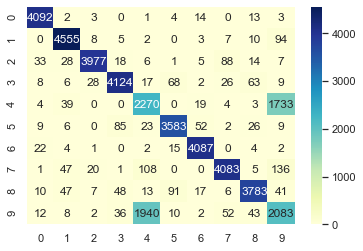

In [48]:
sns.heatmap(confusion_matrix(train.label.values, labels), annot=True, fmt='g', cmap="YlGnBu");

In [50]:
print(classification_report(train.label.values, labels))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4132
           1       0.96      0.97      0.97      4684
           2       0.98      0.95      0.97      4177
           3       0.96      0.95      0.95      4351
           4       0.52      0.56      0.54      4072
           5       0.95      0.94      0.95      3795
           6       0.97      0.99      0.98      4137
           7       0.96      0.93      0.94      4401
           8       0.95      0.93      0.94      4063
           9       0.51      0.50      0.50      4188

    accuracy                           0.87     42000
   macro avg       0.87      0.87      0.87     42000
weighted avg       0.87      0.87      0.87     42000



In [51]:
X_train = (train.iloc[:,1:].values).astype('float32') # all pixel values
y_train = train.iloc[:,0].values.astype('int32') # only labels i.e targets digits
X_test = test.values.astype('float32')

In [64]:
#expand 1 more dimention as 1 for colour channel gray
X_train = X_train.reshape(X_train.shape[0], 28, 28,1)
X_train.shape

(37800, 28, 28, 1)

In [52]:
# Feature Standardization
mean_px = X_train.mean().astype(np.float32)
std_px = X_train.std().astype(np.float32)

def standardize(x): 
    return (x-mean_px)/std_px

In [56]:
#One Hot encoding of labels
from keras.utils.np_utils import to_categorical
y_train= to_categorical(y_train)
num_classes = y_train.shape[1]
num_classes

10

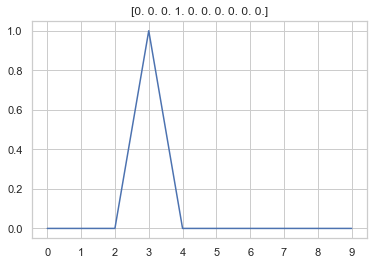

In [57]:
plt.title(y_train[9])
plt.plot(y_train[9])
plt.xticks(range(10));

In [58]:
# fix random seed for reproducibility
seed = 43
np.random.seed(seed)

In [60]:
model= Sequential()
model.add(Lambda(standardize,input_shape=(28,28,1)))
model.add(Flatten())
model.add(Dense(10, activation='softmax'))
print("input shape ",model.input_shape)
print("output shape ",model.output_shape)

input shape  (None, 28, 28, 1)
output shape  (None, 10)


In [61]:
from keras.optimizers import RMSprop
model.compile(optimizer=RMSprop(lr=0.001),
 loss='categorical_crossentropy',
 metrics=['accuracy'])

In [62]:
from keras.preprocessing import image
gen = image.ImageDataGenerator()

In [65]:
# Cross Validation
from sklearn.model_selection import train_test_split
X = X_train
y = y_train
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.10, random_state=42)
batches = gen.flow(X_train, y_train, batch_size=64)
val_batches=gen.flow(X_val, y_val, batch_size=64)

In [66]:
history=model.fit_generator(generator=batches, steps_per_epoch=batches.n, epochs=3, 
                    validation_data=val_batches, validation_steps=val_batches.n)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/3
  532/34020 [..............................] - 1s 2ms/step - loss: 0.4667 - accuracy: 0.8617 - val_loss: 0.3204 - val_accuracy: 0.9077


In [68]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

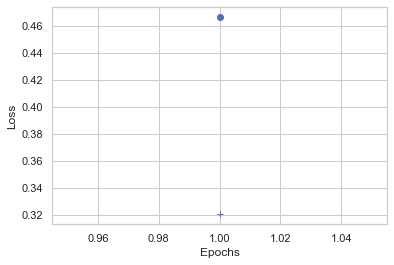

In [69]:
import matplotlib.pyplot as plt
%matplotlib inline
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss_values, 'bo')
# b+ is for "blue crosses"
plt.plot(epochs, val_loss_values, 'b+')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

In [70]:
plt.clf()   # clear figure
acc_values = history_dict['acc']
val_acc_values = history_dict['val_acc']

plt.plot(epochs, acc_values, 'bo')
plt.plot(epochs, val_acc_values, 'b+')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.show()

KeyError: 'acc'

<Figure size 432x288 with 0 Axes>